# BANK CUSTOMER CHURN PREDICTION USING ENSEMBLE - RANDOM FOREST CLASSIFIER ALGORITHM

## 1. IMPORTING THE PYTHON LIBRARIES

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz, export_text
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

import graphviz
import pydotplus

from itertools import product

print("Python Libraries Import Completed")

Python Libraries Import Completed


## 2. LOADING THE RAW DATA FROM A CSV FILE

In [2]:
actual_raw_data = pd.read_csv("/Users/vidhyalakshmiparthasarathy/.CMVolumes/Google-Drive-pbvidhya/~~~VP_Data_Science/DS_Real_Time_Projects/Bank_Customers_Churn_Prediction_Using_Ensemble_Random_Forest_Classifier_Algorithm/data/Bank_Churn_Raw_Data.csv")

print("Raw Data Import Completed")

Raw Data Import Completed


## 3. DATA EXPLORATION

In [3]:
# Verifying the shape of the data

actual_raw_data.shape

(10000, 14)

In [4]:
# Displaying the first 5 Rows of Data Instances

actual_raw_data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [5]:
# Displaying the last 5 Rows of Data Instances

actual_raw_data.tail()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


In [6]:
# Verifying the Column Names in the Raw Data

actual_raw_data.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [7]:
# Verifying the Type of the Columns in the Raw Data

actual_raw_data.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [8]:
# Verifying the Null Values in the Raw Data

actual_raw_data.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

## 4. DATA VISUALISATION

In [9]:
# Creating a New Data Frame To Include Only the Relevant Input Independent Variables and the Output Dependent Variable

raw_data = actual_raw_data[['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                           'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                           'EstimatedSalary', 'Exited']]

raw_data

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


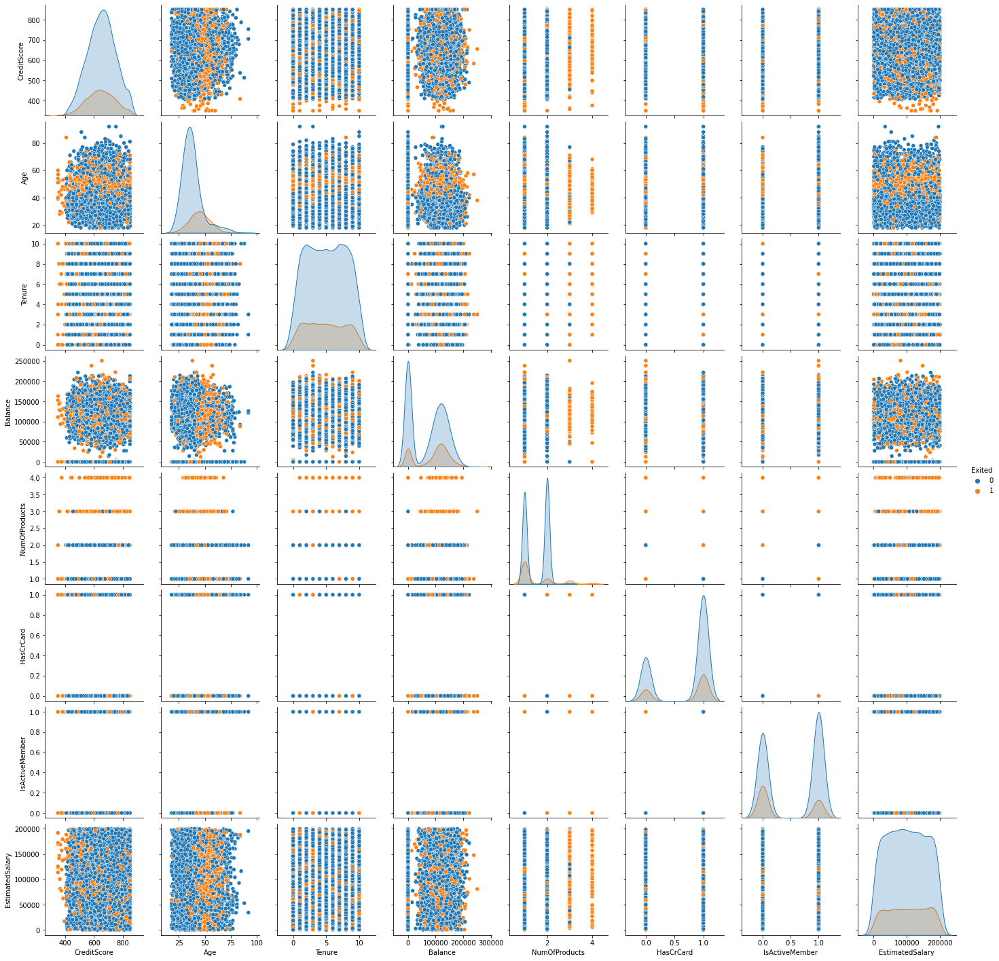

In [10]:
# Pair Plot - Visualising the Relationship Between The Variables

raw_data_graph = sns.pairplot(raw_data, hue='Exited', diag_kws={'bw_method':0.2})

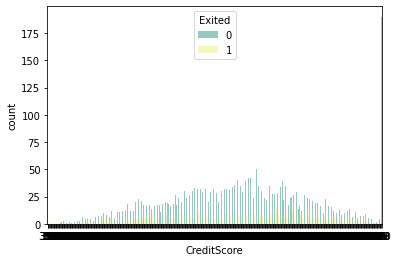

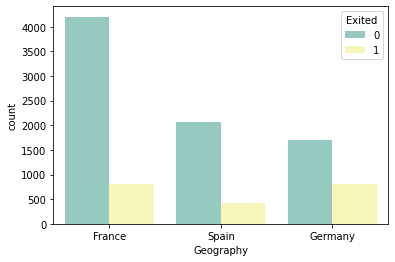

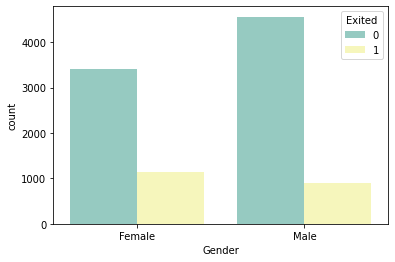

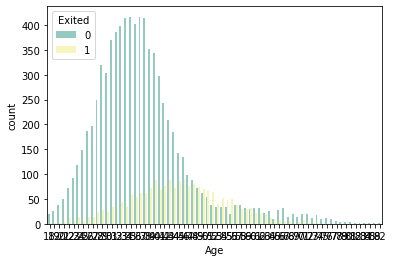

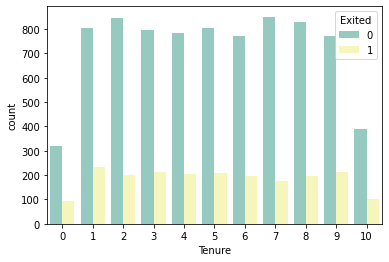

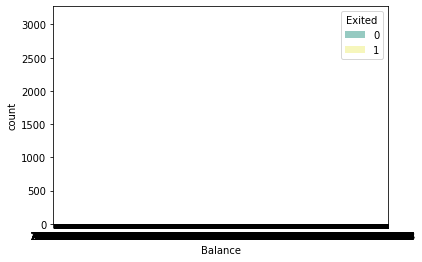

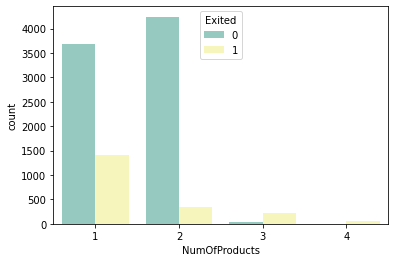

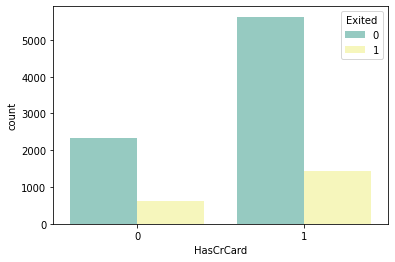

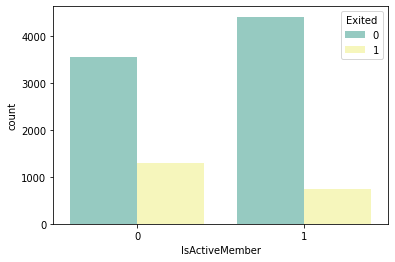

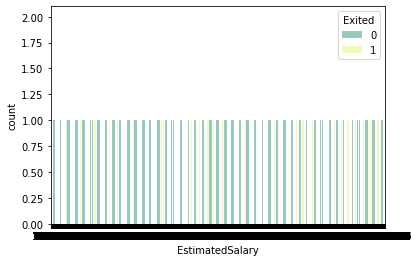

In [11]:
# Count Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

input_features = ['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                 'EstimatedSalary']

for feature in input_features:
    plt.figure()
    feature_count_plot = sns.countplot(x=feature, data=raw_data, hue='Exited', palette="Set3")

### Scatter Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

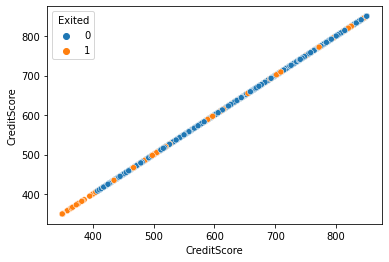

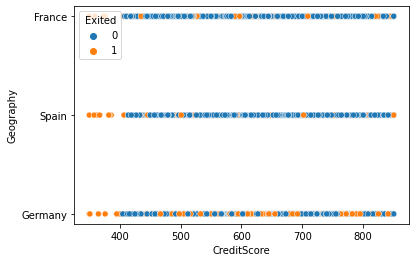

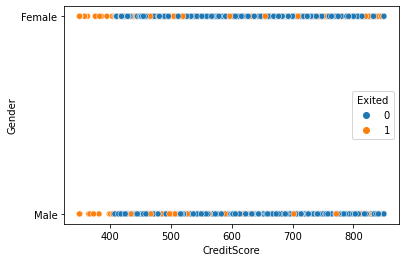

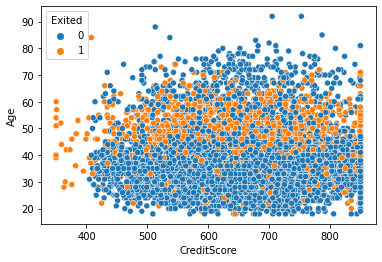

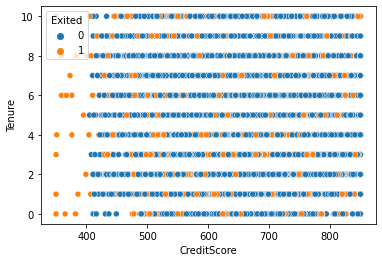

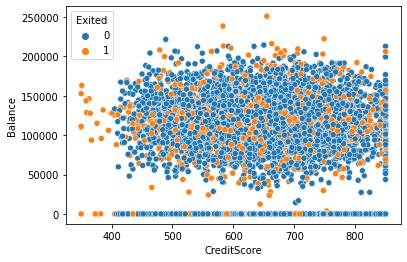

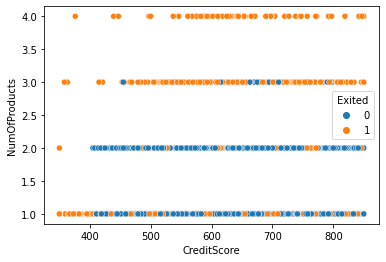

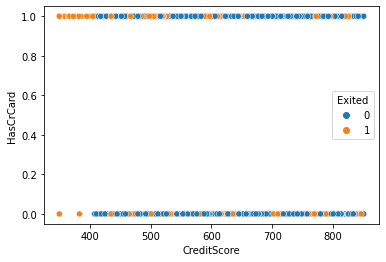

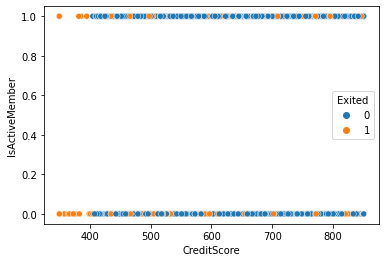

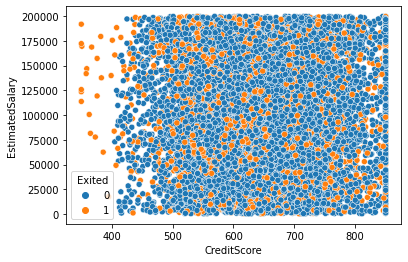

In [12]:
# Scatter Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

input_features = ['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                 'EstimatedSalary']

# Input Variable 'CreditScore'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_1 = sns.scatterplot(data=raw_data, x='CreditScore', y=feature, hue='Exited')

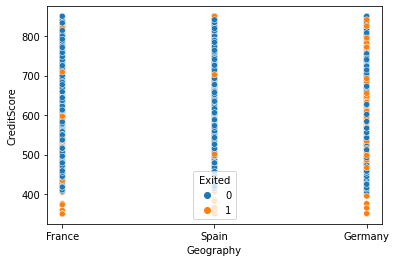

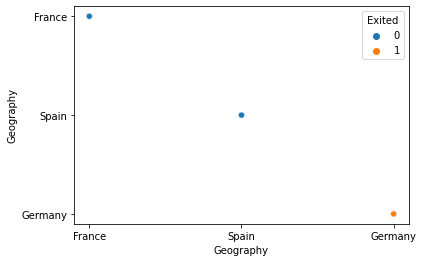

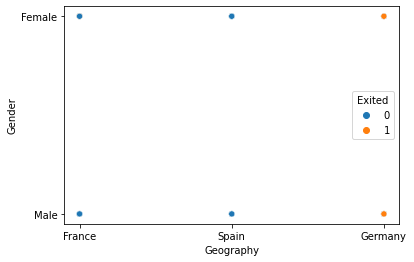

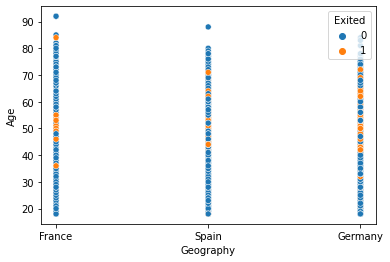

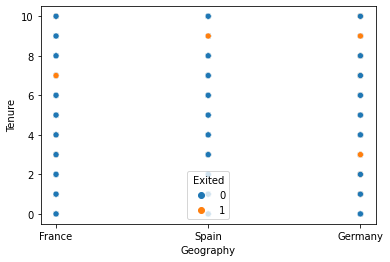

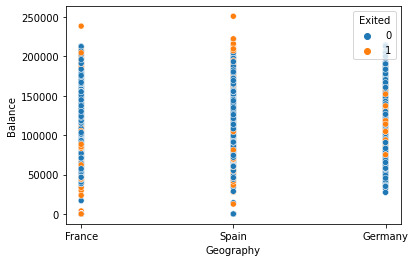

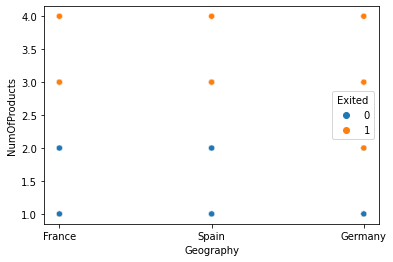

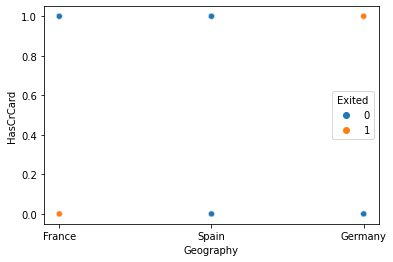

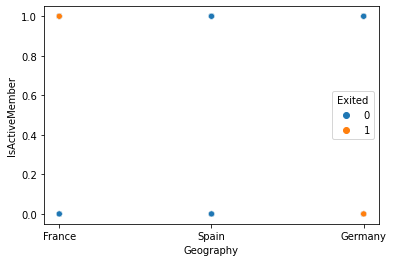

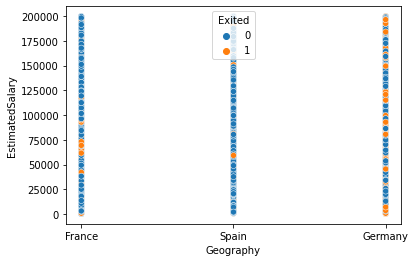

In [13]:
# Input Variable 'Geography'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_2 = sns.scatterplot(data=raw_data, x='Geography', y=feature, hue='Exited')

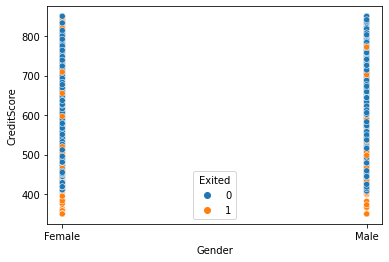

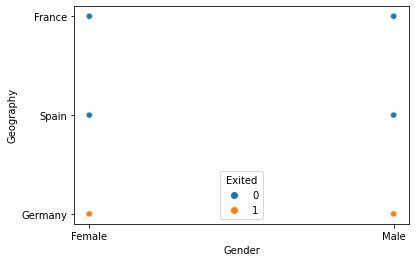

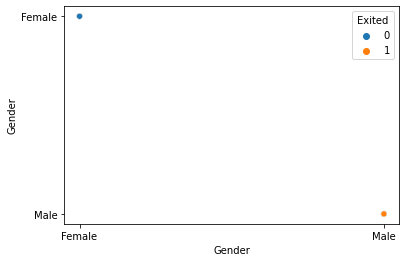

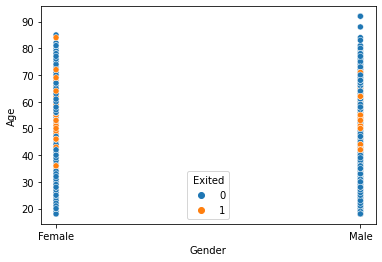

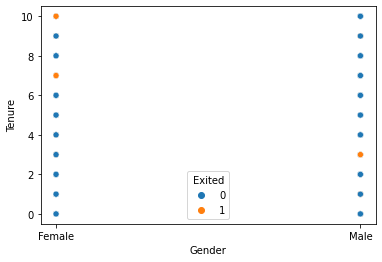

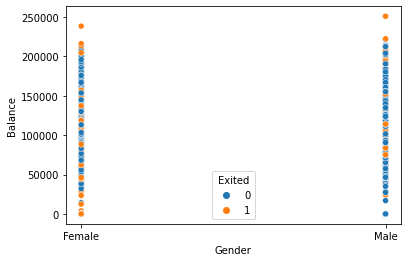

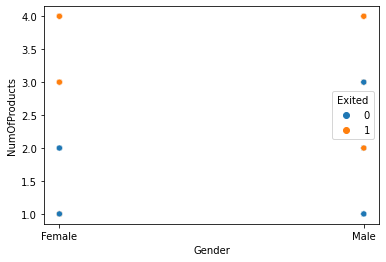

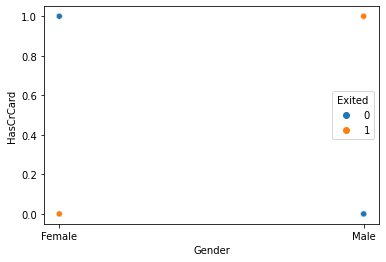

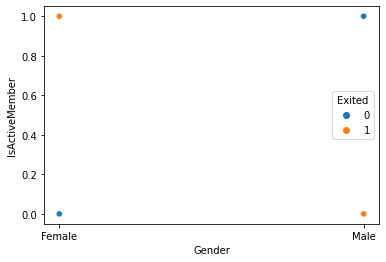

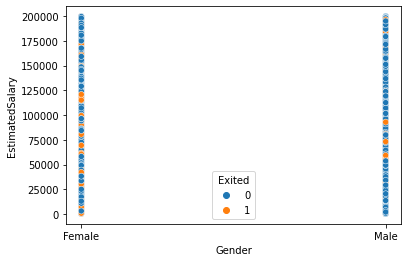

In [14]:
# Input Variable 'Gender'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_3 = sns.scatterplot(data=raw_data, x='Gender', y=feature, hue='Exited')

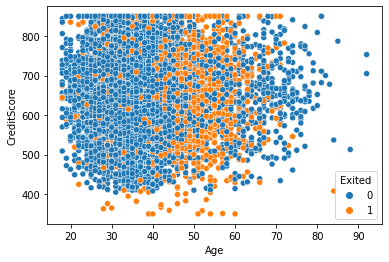

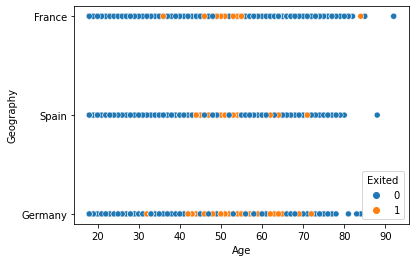

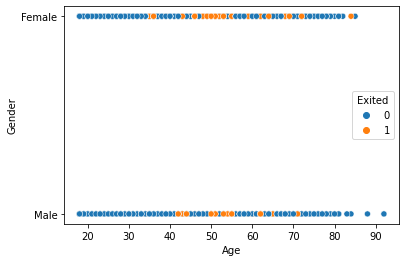

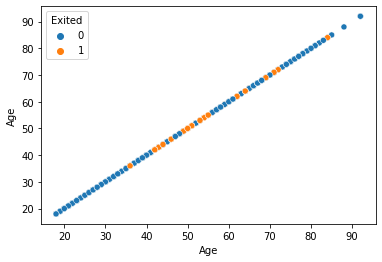

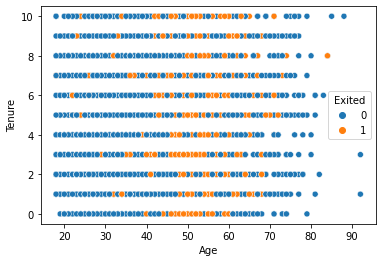

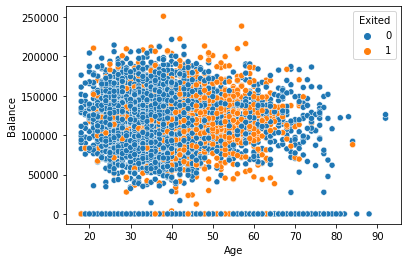

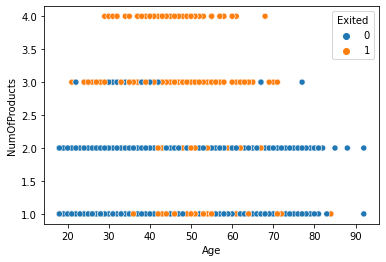

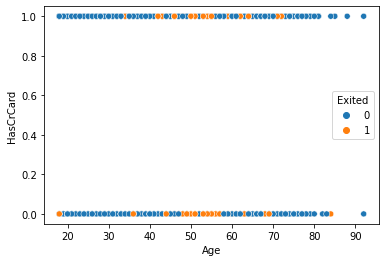

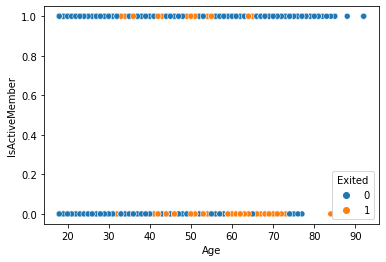

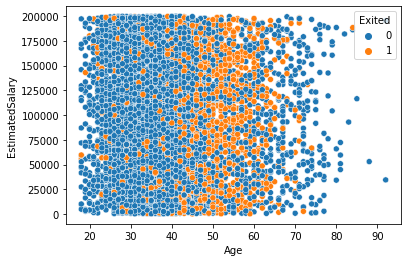

In [15]:
# Input Variable 'Age'

for feature in input_features:
    plt.figure() 
    feature_scatter_plot_4 = sns.scatterplot(data=raw_data, x='Age', y=feature, hue='Exited')

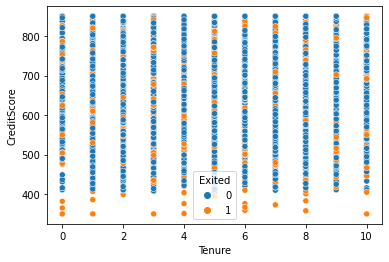

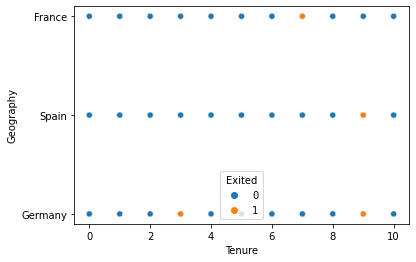

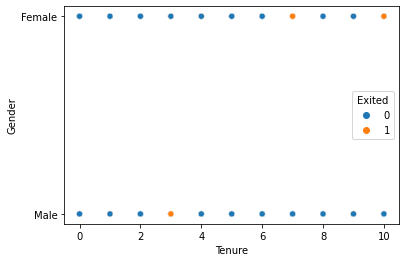

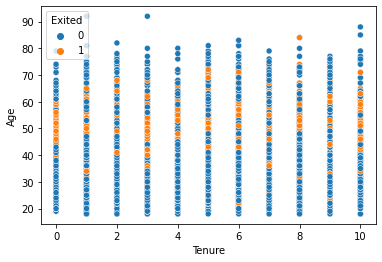

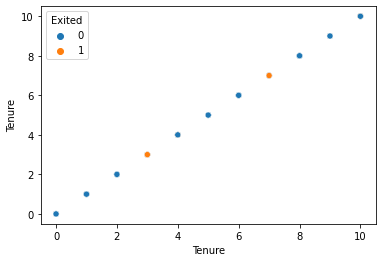

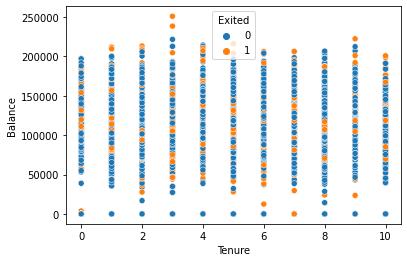

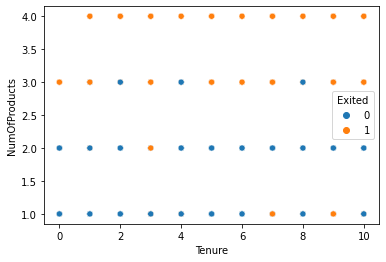

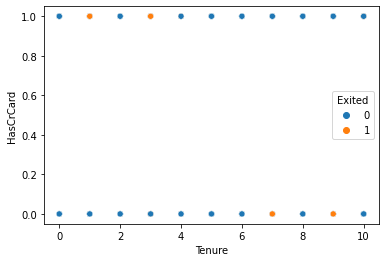

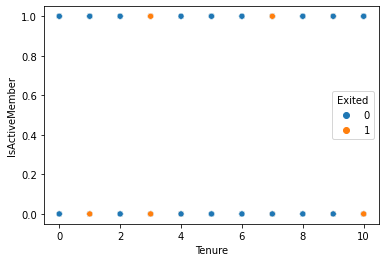

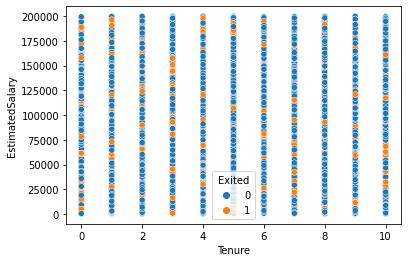

In [16]:
# Input Variable 'Tenure'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_5 = sns.scatterplot(data=raw_data, x='Tenure', y=feature, hue='Exited')

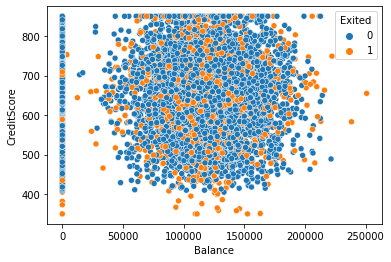

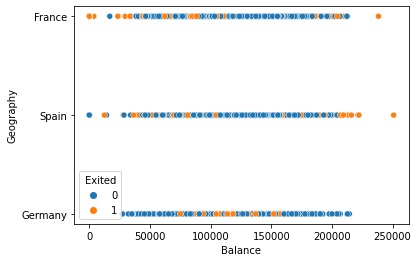

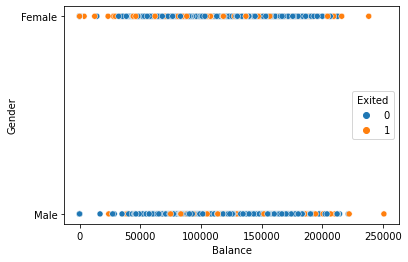

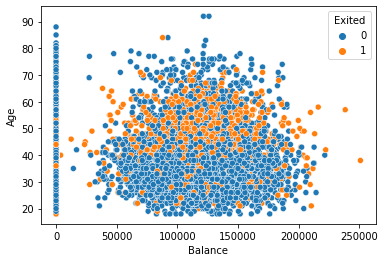

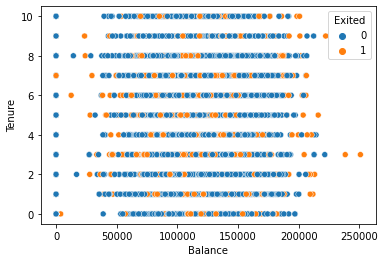

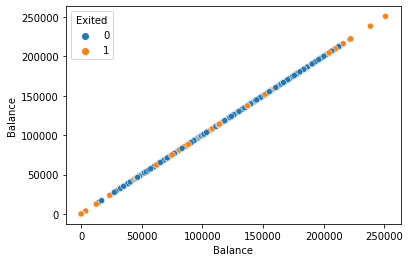

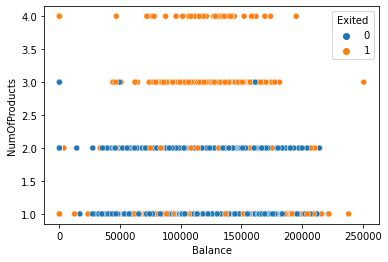

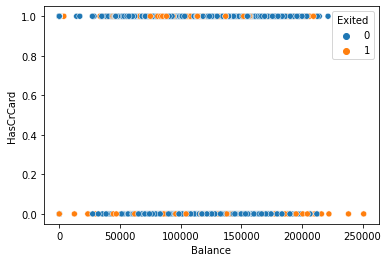

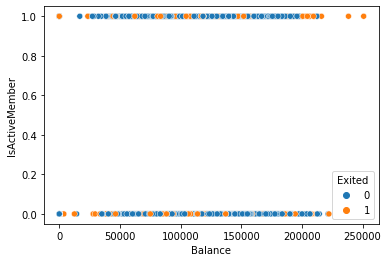

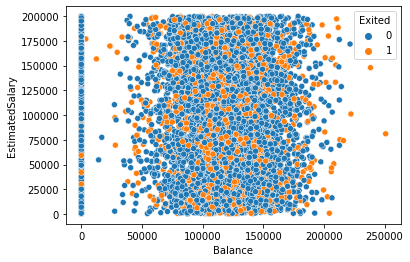

In [17]:
# Input Variable 'Balance'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_6 = sns.scatterplot(data=raw_data, x='Balance', y=feature, hue='Exited')

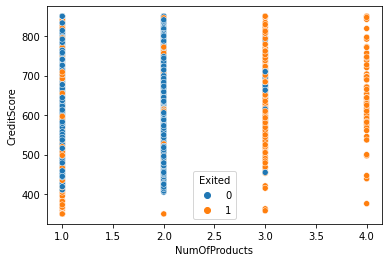

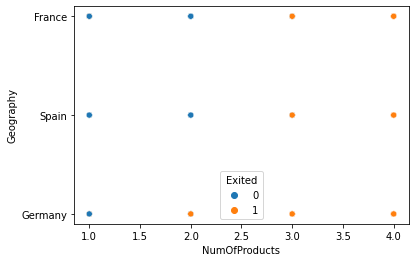

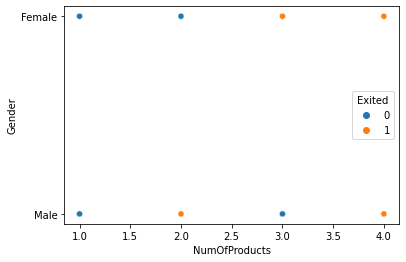

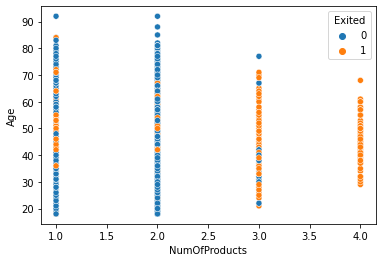

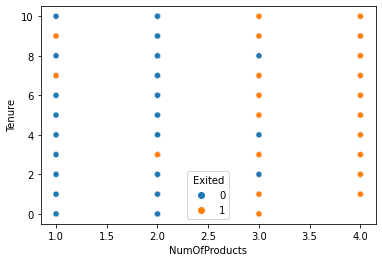

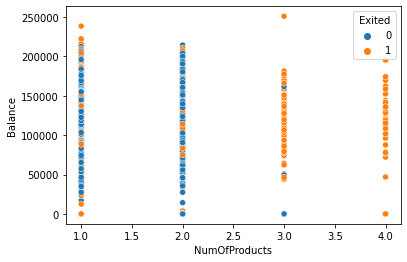

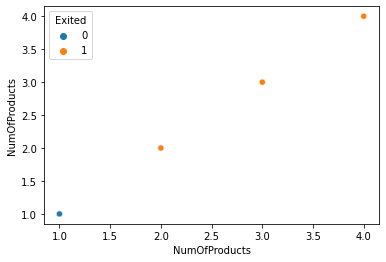

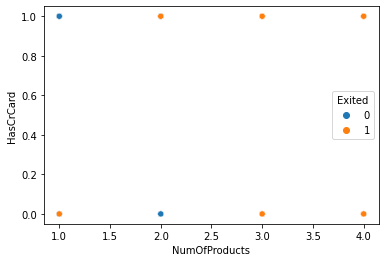

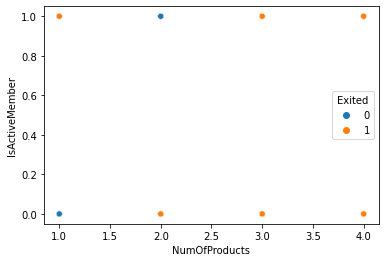

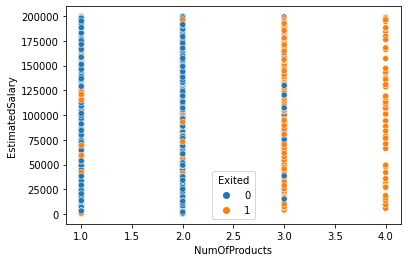

In [18]:
# Input Variable 'NumOfProducts'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_7 = sns.scatterplot(data=raw_data, x='NumOfProducts', y=feature, hue='Exited')

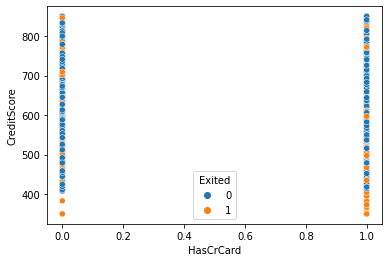

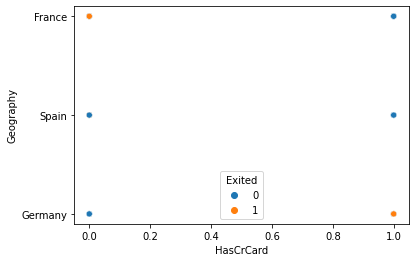

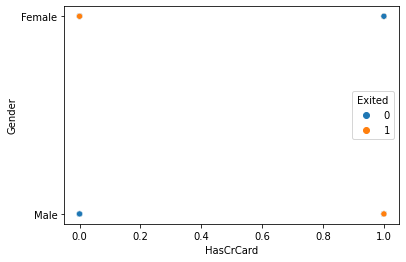

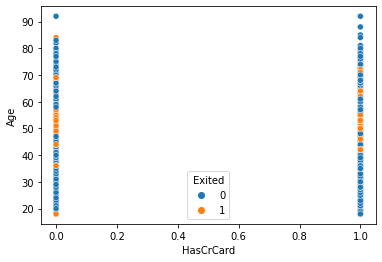

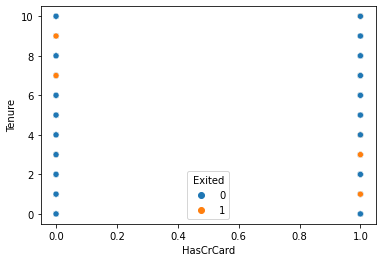

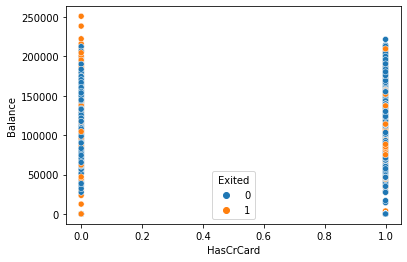

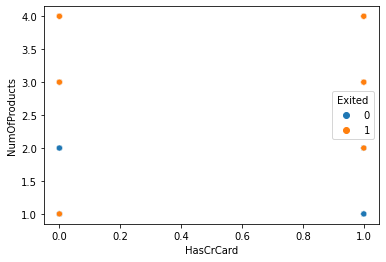

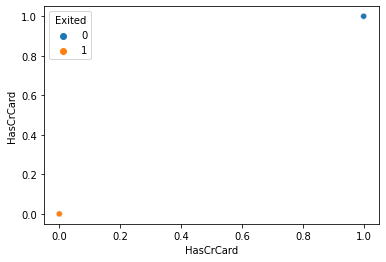

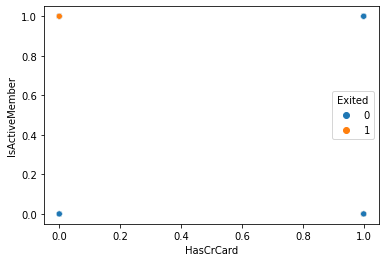

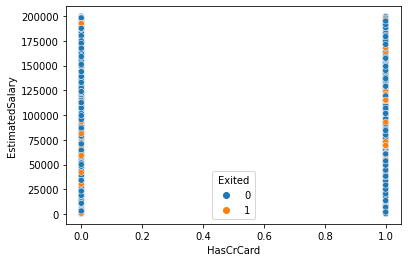

In [19]:
# Input Variable 'HasCrCard'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_8 = sns.scatterplot(data=raw_data, x='HasCrCard', y=feature, hue='Exited')

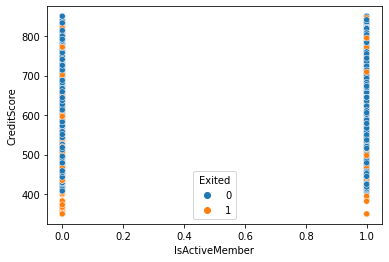

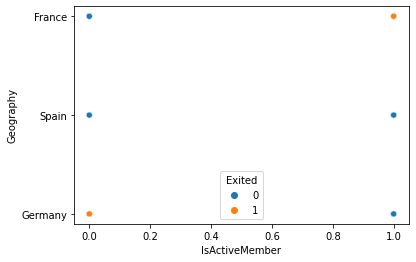

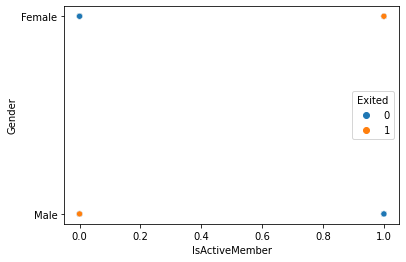

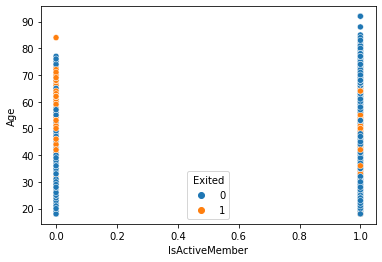

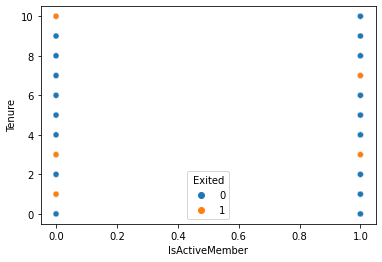

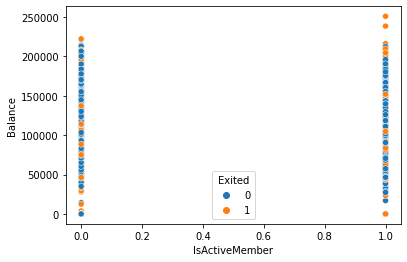

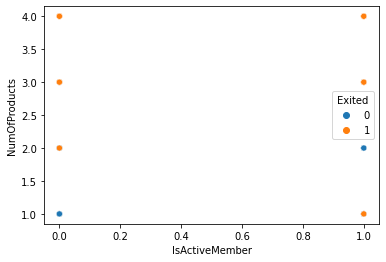

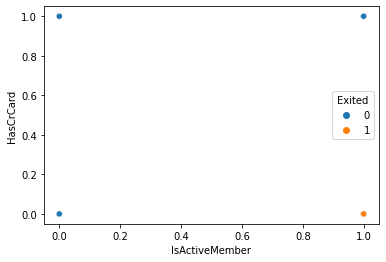

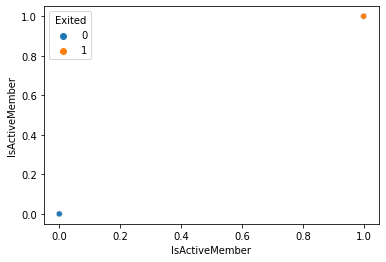

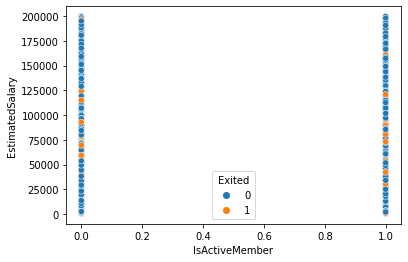

In [20]:
# Input Variable 'IsActiveMember'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_9 = sns.scatterplot(data=raw_data, x='IsActiveMember', y=feature, hue='Exited')

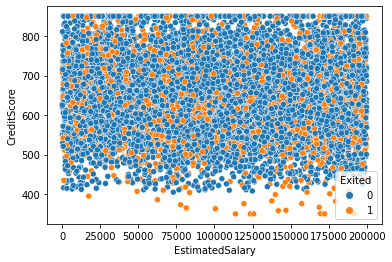

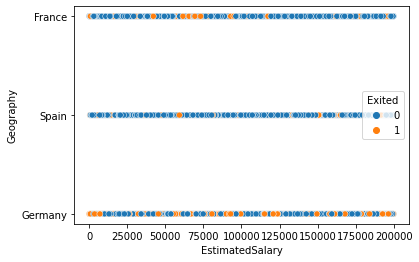

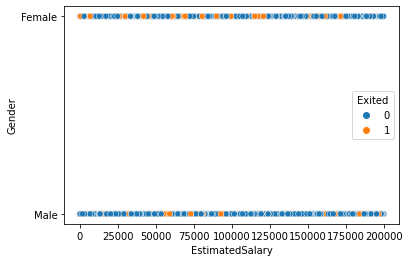

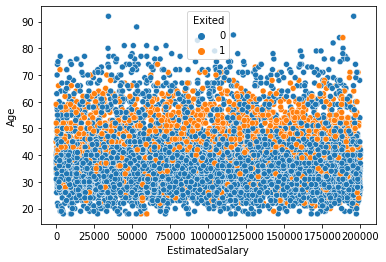

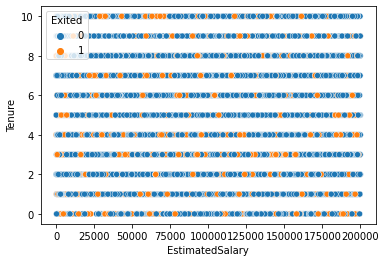

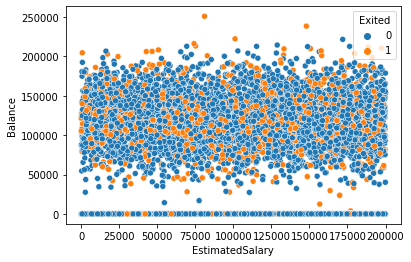

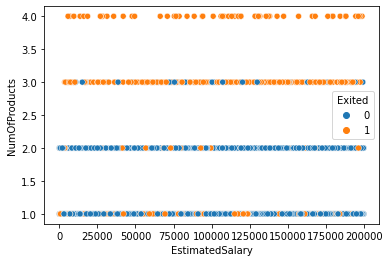

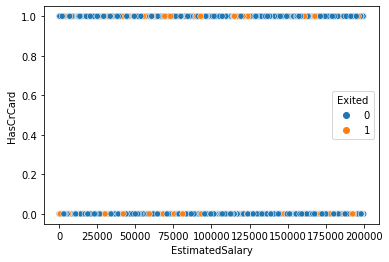

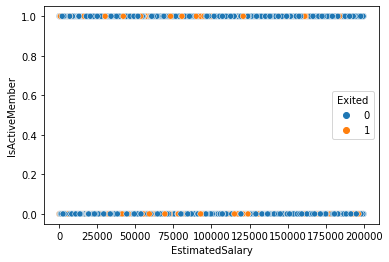

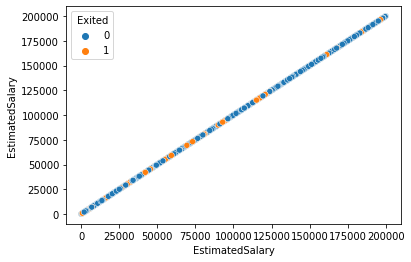

In [21]:
# Input Variable 'EstimatedSalary'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_10 = sns.scatterplot(data=raw_data, x='EstimatedSalary', y=feature, hue='Exited')

## 5. DATA PRE-PROCESSING

In [10]:
# Converting the Categorical Variables into Numeric One-Hot Encoded Variables for Decision Tree IDE Model Training Purposes

raw_data_pp = pd.get_dummies(raw_data, columns=['Geography', 'Gender', 'HasCrCard', 'IsActiveMember'])

print("Execution Completed")

Execution Completed


In [11]:
# Verifying the Columns of the Pre-processed Raw Data Frame after Applying One-Hot Encoding Method

raw_data_pp.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,HasCrCard_0,HasCrCard_1,IsActiveMember_0,IsActiveMember_1
0,619,42,2,0.00,1,101348.88,1,1,0,0,1,0,0,1,0,1
1,608,41,1,83807.86,1,112542.58,0,0,0,1,1,0,1,0,0,1
2,502,42,8,159660.80,3,113931.57,1,1,0,0,1,0,0,1,1,0
3,699,39,1,0.00,2,93826.63,0,1,0,0,1,0,1,0,1,0
4,850,43,2,125510.82,1,79084.10,0,0,0,1,1,0,0,1,0,1


In [12]:
# Verifying the Shape of the Pre-processed Raw Data Frame after Applying One-Hot Encoding Method

raw_data_pp.shape

(10000, 16)

In [13]:
# Normalising the Continuous Variables Columns to Scale to a Value Between 0 and 1 for Decision Tree IDE Model Training Purposes

norm_scale_features = ['CreditScore', 'Age', 'Balance','EstimatedSalary']

norm_scale = MinMaxScaler()

raw_data_pp[norm_scale_features] = norm_scale.fit_transform(raw_data_pp[norm_scale_features])

print("Scaling is Completed")

Scaling is Completed


In [14]:
# Verifying all the Columns of the Final Pre-processed Raw Data Frame after Applying the Scaling Method

raw_data_pp.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,HasCrCard_0,HasCrCard_1,IsActiveMember_0,IsActiveMember_1
0,0.538,0.324324,2,0.000000,1,0.506735,1,1,0,0,1,0,0,1,0,1
1,0.516,0.310811,1,0.334031,1,0.562709,0,0,0,1,1,0,1,0,0,1
2,0.304,0.324324,8,0.636357,3,0.569654,1,1,0,0,1,0,0,1,1,0
3,0.698,0.283784,1,0.000000,2,0.469120,0,1,0,0,1,0,1,0,1,0
4,1.000,0.337838,2,0.500246,1,0.395400,0,0,0,1,1,0,0,1,0,1


In [15]:
# Verifying the Shape of the Pre-processed Raw Data Frame after Applying the Scaling Method

raw_data_pp.shape

(10000, 16)

## 6. DATA SPLIT AS TRAIN DATA AND VALIDATION DATA

In [16]:
# Defining the Input and the Target Vectors for Decision Tree IDE Model Training Purposes

# Input (Independent) Features/Attributes
X = raw_data_pp.drop('Exited', axis=1).values

# Output (Dependent) Target Attribute
y = raw_data_pp['Exited'].values

print("Execution Completed")

Execution Completed


In [17]:
# Verifying the Shape of the Input and the Output Vectors

print("The Input Vector Shape is {}".format(X.shape))
print("The Output Vector Shape is {}".format(y.shape))

The Input Vector Shape is (10000, 15)
The Output Vector Shape is (10000,)


In [18]:
# Splitting the Data Between Train and Validation Data

X_train, X_validate, y_train, y_validate = train_test_split(X, y, train_size=0.9, test_size=0.1, random_state=1)

print("Execution Completed")

Execution Completed


In [19]:
# Verifying the Shape of the Train and the Validation Data

print("Input Train: {}".format(X_train.shape))
print("Output Train: {}\n".format(y_train.shape))
print("Input Validation: {}".format(X_validate.shape))
print("Output Validation: {}".format(y_validate.shape))

Input Train: (9000, 15)
Output Train: (9000,)

Input Validation: (1000, 15)
Output Validation: (1000,)


## 7. TRAINING THE RANDOM FOREST CLASSIFIER

In [20]:
# Creating an Instance of the Random Forest Classifier Model with the Default Parameter Values
random_forest_model = RandomForestClassifier(n_estimators=100, criterion='entropy', 
                                             max_depth=None, min_samples_split=2, 
                                             min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
                                             max_features='auto', max_leaf_nodes=None, 
                                             min_impurity_decrease=0.0, bootstrap=True, 
                                             oob_score=False, n_jobs=None, random_state=10, 
                                             verbose=0, warm_start=False, class_weight=None, 
                                             ccp_alpha=0.0, max_samples=None)

print("Model Training Started.....")

# Training the Random Forest Classifier Model using ID3 Algorithm
random_forest_model.fit(X_train, y_train)

print("Model Training Completed.....")

Model Training Started.....
Model Training Completed.....


## 8. RANDOM FOREST GRAPHICAL REPRESENTATION AND VISUALISATION

### Method 1 : Visualising the Random Forest Base Estimators Decision Trees using export_graphviz() Function

In [21]:
# Method 1 : Visualising the Random Forest Using export_graphviz() Function

# Plotting the 0th Index (First Decision Tree) in the Base Decision Tree Estimator

# Defining the Random Forest Graph Data
graph_data = tree.export_graphviz(random_forest_model.estimators_[0], out_file=None, 
                                  feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                  class_names=raw_data_pp['Exited'].unique().astype(str),
                                  filled=True, rounded=True, special_characters=True,
                                  impurity=True)

#graph_data

# Creating the Random Forest for the Above Graph Data using Graphviz
random_forest_graph = graphviz.Source(graph_data)

# Visualising the Decision Tree
random_forest_graph

### Method 2 : Visualising the Random Forest Base Estimators Decision Trees using graph_from_dot_data() Function

In [34]:
# Method 2 : Visualising the Random Forest Using graph_from_dot_data() Function

# Plotting the 1st Index (Second Decision Tree) in the Base Decision Tree Estimator

# Defining the Random Forest Graph Data
graph_data = tree.export_graphviz(random_forest_model.estimators_[1], out_file=None, 
                                  feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                  class_names=raw_data_pp['Exited'].unique().astype(str),
                                  filled=True, rounded=True, special_characters=True,
                                  impurity=True)

#graph_data


# Creating the Random Forest for the Above Graph Data using pydotplus
pydot_graph = pydotplus.graph_from_dot_data(graph_data)
pydot_graph.write_png('Original_Random_Forest.png')
pydot_graph.set_size('"8,8!"')
pydot_graph.write_png('Resized_Random_Forest.png')

pydot_graph

print("Execution Completed")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.455597 to fit

Execution Completed


### Method 3 : Visualising the Random Forest Base Estimators Decision Trees using plot_tree() Function

In [22]:
# Method 3 : Visualising the Random Forest Using plot_tree() Function

# Plotting the 99th Index (100th Decision Tree) in the Base Decision Tree Estimator

# Defining the Random Forest Graph Data
random_forest_graph = tree.plot_tree(random_forest_model.estimators_[99], feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                     class_names=raw_data_pp['Exited'].unique().astype(str),
                                     filled=True, rounded=True, fontsize=8)

# Visualising the Random Forest
random_forest_graph

[Text(195.6559963630037, 212.91, 'IsActiveMember_1 <= 0.5\nentropy = 0.743\nsamples = 5693\nvalue = [7102, 1898]\nclass = 1'),
 Text(123.82325063792418, 203.85, 'Age <= 0.358\nentropy = 0.849\nsamples = 2719\nvalue = [3135, 1189]\nclass = 1'),
 Text(86.18671601603924, 194.79, 'Geography_France <= 0.5\nentropy = 0.671\nsamples = 2159\nvalue = [2836, 605]\nclass = 1'),
 Text(49.7255830792683, 185.73, 'NumOfProducts <= 2.5\nentropy = 0.759\nsamples = 1053\nvalue = [1308, 367]\nclass = 1'),
 Text(29.011802425768824, 176.67, 'Geography_Germany <= 0.5\nentropy = 0.716\nsamples = 1015\nvalue = [1301, 319]\nclass = 1'),
 Text(15.0846394485684, 167.60999999999999, 'Gender_Male <= 0.5\nentropy = 0.628\nsamples = 507\nvalue = [670, 125]\nclass = 1'),
 Text(6.65694591728526, 158.55, 'EstimatedSalary <= 0.223\nentropy = 0.762\nsamples = 207\nvalue = [261, 74]\nclass = 1'),
 Text(2.3432449628844116, 149.49, 'Age <= 0.196\nentropy = 0.915\nsamples = 58\nvalue = [67, 33]\nclass = 1'),
 Text(1.42014846

Error in callback <function flush_figures at 0x11c7999d0> (for post_execute):


KeyboardInterrupt: 

In [36]:
features = raw_data_pp.drop('Exited', axis=1).columns
feature_names = []
for feature in features:
    feature_names.append(feature)
feature_names

['CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'EstimatedSalary',
 'Geography_France',
 'Geography_Germany',
 'Geography_Spain',
 'Gender_Female',
 'Gender_Male',
 'HasCrCard_0',
 'HasCrCard_1',
 'IsActiveMember_0',
 'IsActiveMember_1']

### Method 4 : Visualising the Random Forest Base Estimators Decision Trees in Text Format using export_text() Function

In [37]:
# Method 4 : Visualising the Random Forest in Text Format using export_text() Function

# Plotting the 49th Index (50th Decision Tree) in the Base Decision Tree Estimator

# Creating a List of Input Feature Names
features = raw_data_pp.drop('Exited', axis=1).columns
feature_names_list = []
for feature in features:
    feature_names_list.append(feature)

# Defining the Random Forest Textual Representation Data
random_forest_text = tree.export_text(random_forest_model.estimators_[49], feature_names=feature_names_list,
                                      spacing=4)

# Visualising the Random Forest in the Textual Format
print(random_forest_text)

|---- Geography_France <= 0.50
|    |---- NumOfProducts <= 2.50
|    |    |---- Balance <= 0.02
|    |    |    |---- Age <= 0.36
|    |    |    |    |---- EstimatedSalary <= 0.17
|    |    |    |    |    |---- Age <= 0.22
|    |    |    |    |    |    |---- Tenure <= 0.50
|    |    |    |    |    |    |    |---- class: 1.0
|    |    |    |    |    |    |---- Tenure >  0.50
|    |    |    |    |    |    |    |---- CreditScore <= 0.63
|    |    |    |    |    |    |    |    |---- Tenure <= 7.50
|    |    |    |    |    |    |    |    |    |---- EstimatedSalary <= 0.01
|    |    |    |    |    |    |    |    |    |    |---- class: 1.0
|    |    |    |    |    |    |    |    |    |---- EstimatedSalary >  0.01
|    |    |    |    |    |    |    |    |    |    |---- class: 0.0
|    |    |    |    |    |    |    |    |---- Tenure >  7.50
|    |    |    |    |    |    |    |    |    |---- Tenure <= 8.50
|    |    |    |    |    |    |    |    |    |    |---- class: 1.0
|    |    |    |    |   

## 9. RETRIEVING THE FEATURE IMPORTANCE VALUES OF THE INPUT FEATURES

In [23]:
# Retrieving the Information Gain i.e.; Feature Importance Values of the Input Features

# Creating an Empty Data Frame to Hold the Feature Name and the Feature's Importance Values
ig_df_final = pd.DataFrame()

# Looping Through Each and Every Input Feature and Retrieving the Feature Importance Value for Each Feature
for feature, column in enumerate(raw_data_pp.drop('Exited', axis=1)):
    print("{} - {}".format(column, random_forest_model.feature_importances_[feature]))
    
    # Creating a Data Frame to Include the Feature Name and the Corresponding Feature Importance Value
    ig_df = pd.DataFrame({'Feature': [column], 'Feature Importance': [random_forest_model.feature_importances_[feature]]})
    
    # Concatenating the Individual Feature Data Frame with the Final Data Frame
    ig_df_final = pd.concat([ig_df_final, ig_df], axis=0, ignore_index=True)
    
# Ordering the Feature Importance Values in the Increasing Order of Importance
ig_df_final_sorted = ig_df_final.sort_values(by='Feature Importance', ascending=False).reset_index(drop=True)
    
ig_df_final_sorted

CreditScore - 0.1495183152131385
Age - 0.23800545345527907
Tenure - 0.09295756704895555
Balance - 0.14161481322194935
NumOfProducts - 0.11782774330441627
EstimatedSalary - 0.15283876843317243
Geography_France - 0.010445573776257908
Geography_Germany - 0.018317681240033946
Geography_Spain - 0.0089953099835054
Gender_Female - 0.008365888450645814
Gender_Male - 0.009060989781321678
HasCrCard_0 - 0.010232962133325507
HasCrCard_1 - 0.010167095776760384
IsActiveMember_0 - 0.016654325093102725
IsActiveMember_1 - 0.014997513088135609


,Feature,Feature Importance
0,Age,0.238005
1,EstimatedSalary,0.152839
2,CreditScore,0.149518
3,Balance,0.141615
4,NumOfProducts,0.117828
5,Tenure,0.092958
6,Geography_Germany,0.018318
7,IsActiveMember_0,0.016654
8,IsActiveMember_1,0.014998
9,Geography_France,0.010446


## 10. CALCULATING AND COMPARING THE TRAINING AND VALIDATION ACCURACY

In [24]:
# Accuracy on the Train Data
print("Training Accuracy: ", random_forest_model.score(X_train, y_train))

# Accuracy on the Validation Data
print("Validation Accuracy: ", random_forest_model.score(X_validate, y_validate))

Training Accuracy:  1.0
Validation Accuracy:  0.856


## 11. VALIDATING THE CLASSIFIER RESULTS ON THE VALIDATION DATA

In [25]:
# Validating the Classifier Results on the Validation Data

y_validate_pred = random_forest_model.predict(X_validate)

y_validate_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## 12. COMPARING THE VALIDATION ACTUALS WITH THE VALIDATION PREDICTIONS

In [26]:
# Comparing the Validation Predictions with the Validation Actuals for the first 20 Data Instances

# Validation Actuals
print(y_validate[:20])

# Validation Predictions
print(y_validate_pred[:20])

[0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


## 13. CONFUSION MATRIX BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [27]:
# Defining the Instance of Confusion Matrix
cm_validation_matrix = confusion_matrix(y_validate, y_validate_pred)

print("Execution Completed")

Execution Completed


## Method 1 : Plotting the Confusion Matrix with Numeric Values using Seaborn heatmap() Function

<AxesSubplot:>

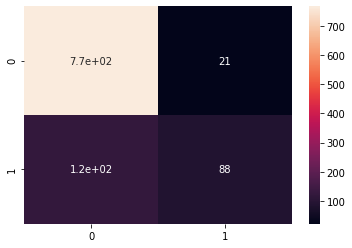

In [28]:
# Method 1 : Plotting the Confusion Matrix with Numeric Values using Seaborn heatmap() Function

churn_cm_plot_1 = sns.heatmap(cm_validation_matrix, annot=True)
churn_cm_plot_1

## Method 2 : Plotting the Confusion Matrix with Percentage Values using Seaborn heatmap() Function

<AxesSubplot:>

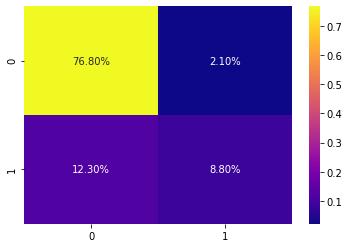

In [29]:
# Method 2 : Plotting the Confusion Matrix with Percentage Values Rounded-off to 2 Decimal Places using Seaborn heatmap() Function

churn_cm_plot_2 = sns.heatmap(cm_validation_matrix/np.sum(cm_validation_matrix), annot=True, fmt='0.2%', cmap='plasma')
churn_cm_plot_2

## Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function

<AxesSubplot:>

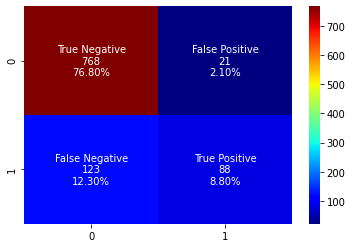

In [30]:
# Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function

cm_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']

cm_counts = ["{0:0.0f}".format(value) for value in cm_validation_matrix.flatten()]

cm_percentages = ["{0:0.2%}".format(value) for value in cm_validation_matrix.flatten()/np.sum(cm_validation_matrix)]

cm_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(cm_names,cm_counts,cm_percentages)]

cm_labels = np.asarray(cm_labels).reshape(2,2)

sns.heatmap(cm_validation_matrix, annot=cm_labels, fmt='', cmap='jet')

## 14. CLASSIFICATION REPORT BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [31]:
# Classification Report and Metrics between the Validation Actuals and the Validation Predictions

target_names = ['No Churn', 'Churn']

# Defining the Classification Report for the Validation Data
classification_report_validation = classification_report(y_validate, y_validate_pred, target_names=target_names)

# Displaying the Classification Report
print(classification_report_validation)

              precision    recall  f1-score   support

    No Churn       0.86      0.97      0.91       789
       Churn       0.81      0.42      0.55       211

    accuracy                           0.86      1000
   macro avg       0.83      0.70      0.73      1000
weighted avg       0.85      0.86      0.84      1000



## 15. INDIVIDUAL CLASSIFIER METRICS BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [32]:
# Individual Classifier Metrics between the Validation Actuals and the Validation Predictions

# Accuracy
churn_accuracy = round((accuracy_score(y_validate, y_validate_pred))*100, 2)

# F1-score
churn_f1_score = round((f1_score(y_validate, y_validate_pred)*100), 2)

# Precision
churn_precision = round((precision_score(y_validate, y_validate_pred)*100), 2)

# Recall
churn_recall = round((recall_score(y_validate, y_validate_pred)*100), 2)

# ROC AUC Score
churn_roc_auc_score = round((roc_auc_score(y_validate, y_validate_pred)*100), 2)

print("Customer Churn Classifier - Accuracy: {}%".format(churn_accuracy))
print("Customer Churn Classifier - F1-Score: {}%".format(churn_f1_score))
print("Customer Churn Classifier - Precision: {}%".format(churn_precision))
print("Customer Churn Classifier - Recall: {}%".format(churn_recall))
print("Customer Churn Classifier - ROC AUC Score: {}%".format(churn_roc_auc_score))

Customer Churn Classifier - Accuracy: 85.6%
Customer Churn Classifier - F1-Score: 55.0%
Customer Churn Classifier - Precision: 80.73%
Customer Churn Classifier - Recall: 41.71%
Customer Churn Classifier - ROC AUC Score: 69.52%


## 16. TUNING THE HYPER-PARAMETERS OF THE RANDOM FOREST CLASSIFIER

### Creating a For Loop to Tune the Random Forest Classifier for the Various Combinations of the Hyper-Parameters

In [33]:
# Calculating the max_features values

max_features_full = ig_df_final_sorted.shape[0]
max_feature_sqrt = math.sqrt(ig_df_final_sorted.shape[0])
max_feature_log2 = math.log2(ig_df_final_sorted.shape[0])

print(max_features_full)
print(max_feature_sqrt)
print(max_feature_log2)

15
3.872983346207417
3.9068905956085187


In [34]:
'''

# Method 1

# Creating a For Loop to Tune the Random Forest Classifier for the Various Combinations of the Hyper-Parameters

# Setting the Values of the Hyper-Parameters to be used for Tuning the Random Forest Classifier
n_estimators = 100
criterion = 'entropy'
max_depth = [1, 2, 3, 4, 5, 6]                    #p1
min_samples_split = [2, 3, 4, 5]                  #p2             
min_samples_leaf = [1, 2, 3, 4, 5]                #p3                         
min_weight_fraction_leaf = [0.0, 0.25, 0.5]       #p4
max_features = ['auto', 'sqrt', 'log2']           #p5                    
max_leaf_nodes = [None, 1, 2]                     #p6                   
min_impurity_decrease = [0.0, 0.1, 0.2, 0.3]      #p7
bootstrap = True                                   
oob_score = False                                   
n_jobs = [1, 2, -1]                               #p8                                
random_state = [None, 10]                         #p9         
verbose = [0, 1, 2]                               #p10                                         
warm_start= False                         
class_weight = None                                
ccp_alpha = [0.0, 0.1, 0.2, 0.3]                  #p11                      
max_samples = None          

for p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11 in product(max_depth, min_samples_split, min_samples_leaf, min_weight_fraction_leaf, 
                                                            max_features, max_leaf_nodes, min_impurity_decrease, n_jobs, 
                                                            random_state, verbose, ccp_alpha):
    
    # Defining the Random Forest Classifier Model with its Hyper-Parameters
    random_forest_tune_model = RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, 
                                                     max_depth=p1, min_samples_split=p2, 
                                                     min_samples_leaf=p3, 
                                                     min_weight_fraction_leaf=p4, 
                                                     max_features=p5, max_leaf_nodes=p6, 
                                                     min_impurity_decrease=p7, bootstrap=bootstrap, 
                                                     oob_score=oob_score, n_jobs=p8, random_state=p9, 
                                                     verbose=p10, warm_start=warm_start, class_weight=class_weight, 
                                                     ccp_alpha=p11)
    
    # Fitting and Training the Random Forest Classifier Model based on its Hyper-Parameters
    random_forest_tune_model.fit(X_train, y_train)
    
    # Predicting the Classifier on the Validation Data
    y_validate_tune_pred = random_forest_tune_model.predict(X_validate)
    
    # Calculating the Accuracy
    churn_tune_accuracy = round((accuracy_score(y_validate, y_validate_tune_pred))*100, 2)
    
    # Displaying the Accuracy Metrics for the Various Combinations of the Hyper-Parameters Tuning
    print("max_depth: {}, min_samples_split: {}, min_samples_leaf: {}, min_weight_fraction_leaf: {}, max_features: {}, max_leaf_nodes: {}, min_impurity_decrease: {}, n_jobs: {}, random_state: {}, verbose: {}, ccp_alpha: {} \n Classification Accuracy: {}% \n".format(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, churn_tune_accuracy))
    
    # Defining the Instance of Confusion Matrix
    cm_validation_matrix_tune = confusion_matrix(y_validate, y_validate_tune_pred)
                                                                                                                                    
    # Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function
    cm_names_tune = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
    cm_counts_tune = ["{0:0.0f}".format(value) for value in cm_validation_matrix_tune.flatten()]
    cm_percentages_tune = ["{0:0.2%}".format(value) for value in cm_validation_matrix_tune.flatten()/np.sum(cm_validation_matrix_tune)]
    cm_labels_tune = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(cm_names_tune, cm_counts_tune, cm_percentages_tune)]
    cm_labels_tune = np.asarray(cm_labels_tune).reshape(2,2)
    sns.heatmap(cm_validation_matrix_tune, annot=cm_labels_tune, fmt='', cmap='jet')                                                                                            
    title = "Confusion Matrix - max_depth: {}, min_samples_split: {}, min_samples_leaf: {}, min_weight_fraction_leaf: {}, max_features: {}, max_leaf_nodes: {}, min_impurity_decrease: {}, n_jobs: {}, random_state: {}, verbose: {}, ccp_alpha: {} \n Classification Accuracy: {}%".format(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, churn_tune_accuracy)
                                                                
'''


'\n\n# Method 1\n\n# Creating a For Loop to Tune the Random Forest Classifier for the Various Combinations of the Hyper-Parameters\n\n# Setting the Values of the Hyper-Parameters to be used for Tuning the Random Forest Classifier\nn_estimators = 100\ncriterion = \'entropy\'\nmax_depth = [1, 2, 3, 4, 5, 6]                    #p1\nmin_samples_split = [2, 3, 4, 5]                  #p2             \nmin_samples_leaf = [1, 2, 3, 4, 5]                #p3                         \nmin_weight_fraction_leaf = [0.0, 0.25, 0.5]       #p4\nmax_features = [\'auto\', \'sqrt\', \'log2\']           #p5                    \nmax_leaf_nodes = [None, 1, 2]                     #p6                   \nmin_impurity_decrease = [0.0, 0.1, 0.2, 0.3]      #p7\nbootstrap = True                                   \noob_score = False                                   \nn_jobs = [1, 2, -1]                               #p8                                \nrandom_state = [None, 10]                         #p9         

 Scenario 1 - max_depth: 1, max_features: auto, Classification Accuracy: 78.9%
 Scenario 2 - max_depth: 1, max_features: sqrt, Classification Accuracy: 78.9%
 Scenario 3 - max_depth: 1, max_features: log2, Classification Accuracy: 78.9%
 Scenario 4 - max_depth: 2, max_features: auto, Classification Accuracy: 79.3%
 Scenario 5 - max_depth: 2, max_features: sqrt, Classification Accuracy: 79.3%
 Scenario 6 - max_depth: 2, max_features: log2, Classification Accuracy: 79.3%
 Scenario 7 - max_depth: 3, max_features: auto, Classification Accuracy: 80.6%
 Scenario 8 - max_depth: 3, max_features: sqrt, Classification Accuracy: 80.6%
 Scenario 9 - max_depth: 3, max_features: log2, Classification Accuracy: 80.6%
 Scenario 10 - max_depth: 4, max_features: auto, Classification Accuracy: 82.6%
 Scenario 11 - max_depth: 4, max_features: sqrt, Classification Accuracy: 82.6%
 Scenario 12 - max_depth: 4, max_features: log2, Classification Accuracy: 82.6%
 Scenario 13 - max_depth: 5, max_features: auto, 

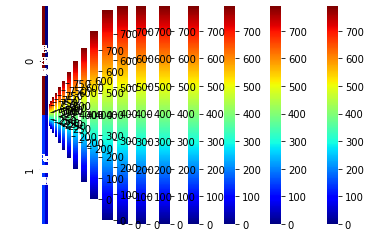

In [35]:
# Method 2

# Creating a For Loop to Tune the Random Forest Classifier for the Various Combinations of the Hyper-Parameters

# Setting the Values of the Hyper-Parameters to be used for Tuning the Random Forest Classifier
n_estimators = 100
criterion = 'entropy'
max_depth = [1, 2, 3, 4, 5, 6]                    #p1
min_samples_split = 2                            
min_samples_leaf = 1                                       
min_weight_fraction_leaf = 0.0      
max_features = ['auto', 'sqrt', 'log2']           #p2                   
max_leaf_nodes = None                                      
min_impurity_decrease = 0.0     
bootstrap = True                                   
oob_score = False                                   
n_jobs = None                                                            
random_state = 10                                 
verbose = 0                                                                
warm_start= False                         
class_weight = None                                
ccp_alpha = 0.0                                   
max_samples = None          

scenario_id = 0

for p1, p2 in product(max_depth, max_features):
    
    # Defining the Random Forest Classifier Model with its Hyper-Parameters
    random_forest_tune_model = RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, 
                                                     max_depth=p1, min_samples_split=min_samples_split, 
                                                     min_samples_leaf=min_samples_leaf, 
                                                     min_weight_fraction_leaf=min_weight_fraction_leaf, 
                                                     max_features=p2, max_leaf_nodes=max_leaf_nodes, 
                                                     min_impurity_decrease=min_impurity_decrease, bootstrap=bootstrap, 
                                                     oob_score=oob_score, n_jobs=n_jobs, random_state=random_state, 
                                                     verbose=verbose, warm_start=warm_start, class_weight=class_weight, 
                                                     ccp_alpha=ccp_alpha)
    
    # Fitting and Training the Random Forest Classifier Model based on its Hyper-Parameters
    random_forest_tune_model.fit(X_train, y_train)
    
    # Predicting the Classifier on the Validation Data
    y_validate_tune_pred = random_forest_tune_model.predict(X_validate)
    
    # Calculating the Accuracy
    churn_tune_accuracy = round((accuracy_score(y_validate, y_validate_tune_pred))*100, 2)
    
    # Incrementing the Scenario_ID for Tracking
    scenario_id += 1
    
    # Displaying the Accuracy Metrics for the Various Combinations of the Hyper-Parameters Tuning
    print(" Scenario {} - max_depth: {}, max_features: {}, Classification Accuracy: {}%".format(scenario_id, p1, p2, churn_tune_accuracy))
    
    # Defining the Instance of Confusion Matrix
    cm_validation_matrix_tune = confusion_matrix(y_validate, y_validate_tune_pred)
                                                                                                                                    
    # Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function
    cm_names_tune = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
    cm_counts_tune = ["{0:0.0f}".format(value) for value in cm_validation_matrix_tune.flatten()]
    cm_percentages_tune = ["{0:0.2%}".format(value) for value in cm_validation_matrix_tune.flatten()/np.sum(cm_validation_matrix_tune)]
    cm_labels_tune = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(cm_names_tune, cm_counts_tune, cm_percentages_tune)]
    cm_labels_tune = np.asarray(cm_labels_tune).reshape(2,2)
    plot = sns.heatmap(cm_validation_matrix_tune, annot=cm_labels_tune, fmt='', cmap='jet')                                                                                           
    title = "Confusion Matrix {} - max_depth: {}, max_features: {}, Classification Accuracy: {}%".format(scenario_id, p1, p2, churn_tune_accuracy)
    plot
    

 Scenario 1 - max_depth: 1, max_features: auto, Classification Accuracy: 78.9%


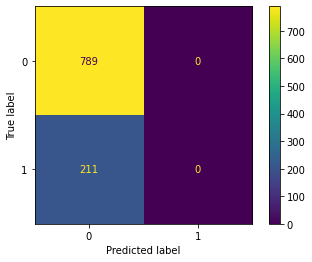

 Scenario 2 - max_depth: 1, max_features: sqrt, Classification Accuracy: 78.9%


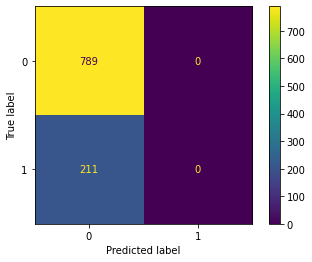

 Scenario 3 - max_depth: 1, max_features: log2, Classification Accuracy: 78.9%


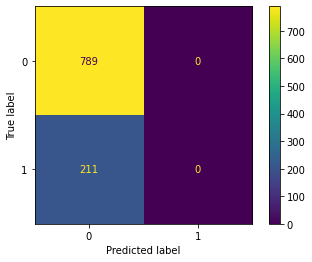

 Scenario 4 - max_depth: 2, max_features: auto, Classification Accuracy: 79.3%


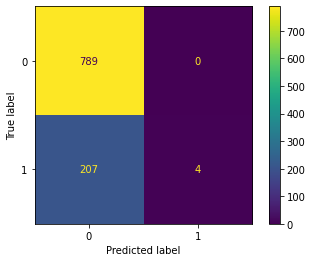

 Scenario 5 - max_depth: 2, max_features: sqrt, Classification Accuracy: 79.3%


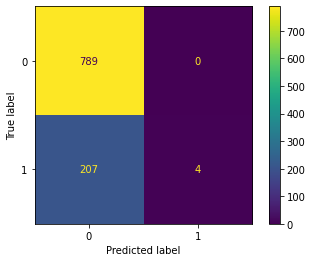

 Scenario 6 - max_depth: 2, max_features: log2, Classification Accuracy: 79.3%


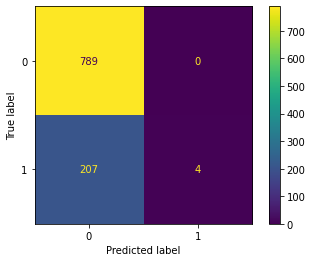

 Scenario 7 - max_depth: 3, max_features: auto, Classification Accuracy: 80.6%


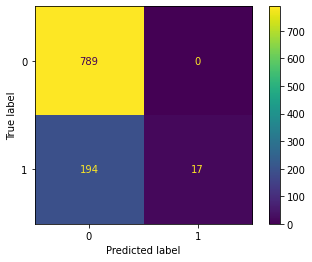

 Scenario 8 - max_depth: 3, max_features: sqrt, Classification Accuracy: 80.6%


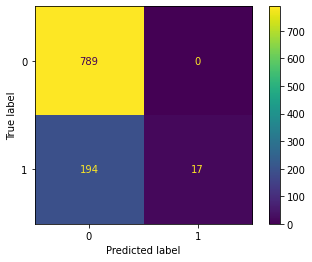

 Scenario 9 - max_depth: 3, max_features: log2, Classification Accuracy: 80.6%


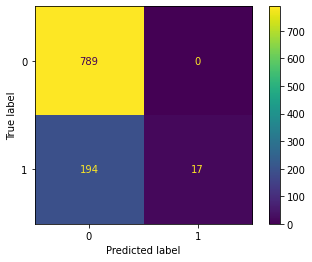

 Scenario 10 - max_depth: 4, max_features: auto, Classification Accuracy: 82.6%


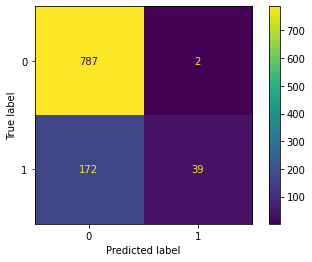

 Scenario 11 - max_depth: 4, max_features: sqrt, Classification Accuracy: 82.6%


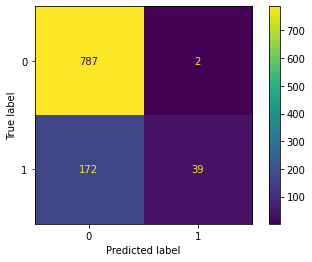

 Scenario 12 - max_depth: 4, max_features: log2, Classification Accuracy: 82.6%


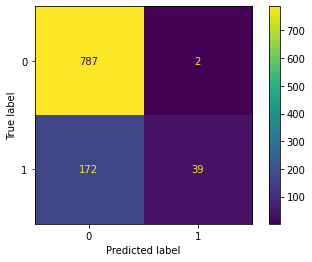

 Scenario 13 - max_depth: 5, max_features: auto, Classification Accuracy: 83.4%


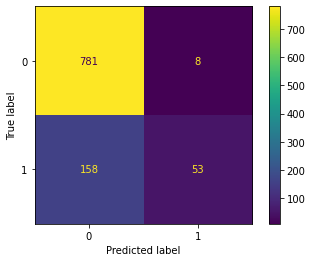

 Scenario 14 - max_depth: 5, max_features: sqrt, Classification Accuracy: 83.4%


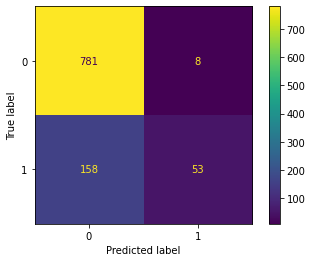

 Scenario 15 - max_depth: 5, max_features: log2, Classification Accuracy: 83.4%


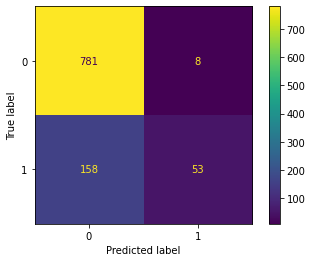

 Scenario 16 - max_depth: 6, max_features: auto, Classification Accuracy: 84.5%


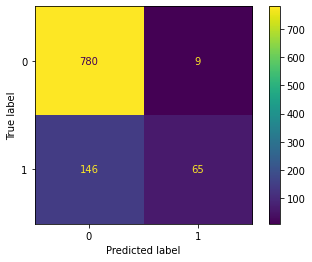

 Scenario 17 - max_depth: 6, max_features: sqrt, Classification Accuracy: 84.5%


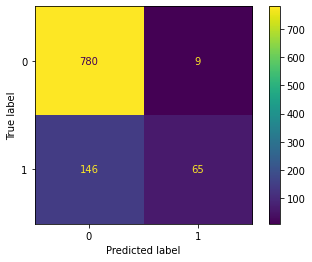

 Scenario 18 - max_depth: 6, max_features: log2, Classification Accuracy: 84.5%


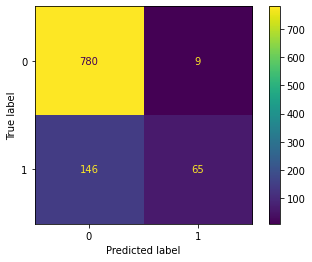

In [36]:
# Method 3

# Creating a For Loop to Tune the Random Forest Classifier for the Various Combinations of the Hyper-Parameters

# Setting the Values of the Hyper-Parameters to be used for Tuning the Random Forest Classifier
n_estimators = 100
criterion = 'entropy'
max_depth = [1, 2, 3, 4, 5, 6]                    #p1
min_samples_split = 2                            
min_samples_leaf = 1                                       
min_weight_fraction_leaf = 0.0      
max_features = ['auto', 'sqrt', 'log2']           #p2                   
max_leaf_nodes = None                                      
min_impurity_decrease = 0.0     
bootstrap = True                                   
oob_score = False                                   
n_jobs = None                                                            
random_state = 10                                 
verbose = 0                                                                
warm_start= False                         
class_weight = None                                
ccp_alpha = 0.0                                   
max_samples = None          

scenario_id = 0

for p1, p2 in product(max_depth, max_features):
    
    # Defining the Random Forest Classifier Model with its Hyper-Parameters
    random_forest_tune_model = RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, 
                                                     max_depth=p1, min_samples_split=min_samples_split, 
                                                     min_samples_leaf=min_samples_leaf, 
                                                     min_weight_fraction_leaf=min_weight_fraction_leaf, 
                                                     max_features=p2, max_leaf_nodes=max_leaf_nodes, 
                                                     min_impurity_decrease=min_impurity_decrease, bootstrap=bootstrap, 
                                                     oob_score=oob_score, n_jobs=n_jobs, random_state=random_state, 
                                                     verbose=verbose, warm_start=warm_start, class_weight=class_weight, 
                                                     ccp_alpha=ccp_alpha)
    
    # Fitting and Training the Random Forest Classifier Model based on its Hyper-Parameters
    random_forest_tune_model.fit(X_train, y_train)
    
    # Predicting the Classifier on the Validation Data
    y_validate_tune_pred = random_forest_tune_model.predict(X_validate)
    
    # Calculating the Accuracy
    churn_tune_accuracy = round((accuracy_score(y_validate, y_validate_tune_pred))*100, 2)
    
    # Incrementing the Scenario_ID for Tracking
    scenario_id += 1
    
    # Displaying the Accuracy Metrics for the Various Combinations of the Hyper-Parameters Tuning
    print(" Scenario {} - max_depth: {}, max_features: {}, Classification Accuracy: {}%".format(scenario_id, p1, p2, churn_tune_accuracy))
    
    # Defining the Instance of Confusion Matrix
    plot_confusion_matrix(random_forest_tune_model, X_validate, y_validate)  
    plt.show()
    title = "Confusion Matrix {} - max_depth: {}, max_features: {}, Classification Accuracy: {}%".format(scenario_id, p1, p2, churn_tune_accuracy)


## 17. CONFUSION MATRIX - OPTIMIZED MODEL/S

### Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function

<AxesSubplot:>

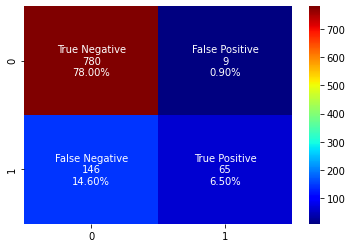

In [38]:
# Defining the Instance of Confusion Matrix - Optimized Random Forest Classifier Model/s

cm_validation_matrix_optim_model = confusion_matrix(y_validate, y_validate_tune_pred)

# Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function
# Optimized Random Forest Classifier Model/s

cm_names_optim = ['True Negative', 'False Positive', 'False Negative', 'True Positive']

cm_counts_optim = ["{0:0.0f}".format(value) for value in cm_validation_matrix_optim_model.flatten()]

cm_percentages_optim = ["{0:0.2%}".format(value) for value in cm_validation_matrix_optim_model.flatten()/np.sum(cm_validation_matrix_optim_model)]

cm_labels_optim = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(cm_names_optim,cm_counts_optim,cm_percentages_optim)]

cm_labels_optim = np.asarray(cm_labels_optim).reshape(2,2)

sns.heatmap(cm_validation_matrix_optim_model, annot=cm_labels_optim, fmt='', cmap='jet')

## 18. CLASSIFICATION REPORT BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS - OPTIMIZED MODEL/S

In [39]:
# Optimized Random Forest Classifier Model

# Classification Report and Metrics between the Validation Actuals and the Validation Predictions

target_names = ['No Churn', 'Churn']

# Defining the Classification Report for the Validation Data
classification_report_validation_optim_model = classification_report(y_validate, y_validate_tune_pred, target_names=target_names)

# Displaying the Classification Report
print(classification_report_validation)

              precision    recall  f1-score   support

    No Churn       0.86      0.97      0.91       789
       Churn       0.81      0.42      0.55       211

    accuracy                           0.86      1000
   macro avg       0.83      0.70      0.73      1000
weighted avg       0.85      0.86      0.84      1000



### As we can see from the above results; the Random Forest Classifier Model tuned with the parameters as max_depth = 6 and max_features as auto, sqrt, log2 has performed better in the validation data with the accuracy of about 84.5%.

### Hence all of these 3 models can be considered as the Optimized Models for further deployment.